# __Classical Controllers Demonstration__

Getting the script set up. Remember to run:
1) activate .
2) instantiate

In [ ]:
using DrWatson;
@quickactivate "dare";

using Plots;
using LinearAlgebra;
using FFTW;
using ControlSystems;
using ReinforcementLearning;
using IntervalSets;
using CUDA;

include(srcdir("Classical_Control.jl"));
include(srcdir("Power_System_Theory.jl"));
include(srcdir("Classical_Control_Plots.jl"));
include(srcdir("nodeconstructor.jl"));
include(srcdir("env.jl"));

_______________________________________________________________________________
## Parameters - Time simulation

Here we set the simulation time step, which is the inverse of both the sampling and switching frequencies. Also we specify the number of classically controllable sources and the loads and their power parameters.

In [2]:
Timestep = 100; #time step in μs ~ 100μs => 10kHz, 50μs => 20kHz, 20μs => 50kHz
t_final = 1.5; #time in seconds, total simulation run time

num_sources = 2;
num_loads = 1;

# Load 1 Impedance
Vo_rms = 230; # rms output voltage

SL1 = 75e3; # VA, 3-ph Apparent Power
pf1 = 0.6; # power factor
SL2 = 50e3; # VA, 3-ph Apparent Power
pf2 = -0.9999; # power factor

#_______________________________________________________________________________
# Environment Calcs
Nps = (1/(Timestep*1e-6)); # time intervals
μps = 1/Nps; # time step
t = 0:μps:t_final; # time

f_cntr = 1/μps; # Hz, Sampling frequency of controller ~ 15 kHz -> 50kHz

_______________________________________________________________________________
## Classical Source Settings

Each source represents a three-phase half-bridge power electronic converter, which is electricallly modelled as an ideal voltage source connected to a network through a filter.

Each source may be run in one of a number of modes. The mode selection is stored in a dictionary found within the mutable struct (a julia object). If you don't feel like typing in the full string, you may specify the mode by just passing throught the corresponding index.<br>

>1. "Voltage Control Mode" - controls the output voltage to nominal (e.g. 230 V rms)<br>
>2. "PQ Control Mode" - controls the output real and imaginary powers to nominal<br>
>3. "Droop Control Mode" - a higher level voltage control mode with dynamic power balancing<br>
>4. "Synchronverter Mode" - mimics a virtual synchronous generator<br>
>5. "Swing Mode" - no control, just creates a sinusoidal output voltage


In [3]:
#_______________________________________________________________________________
# Setting up the Sources
Source = Source_Controller(t_final, f_cntr, num_sources, delay = 1);

#=
    Typical values for the frequency droop are a 100% increase in power for a
    frequency decrease between 3% and 5% (from nominal values)
=#

Source.Δfmax = 0.03*50/100; # The drop in frequency, Hz, which will cause a 100% increase in active power
Source.ΔEmax = 0.05*230/100; # The drop in rms voltage, which will cause a 100% decrease in reactive power
τ = 1.0;

Source.τv = τ; # time constant of the voltage loop
Source.τf = τ;

Mode_Keys = collect(keys(Source.Modes));

Source_Initialiser(Source, Mode_Keys[3], num_source = 1, Prated = 150e3);
Source_Initialiser(Source, Mode_Keys[3], num_source = 2, Prated = 100e3);


Error. Voltage Controller with Positive Poles.
Source = 1


Error. Voltage Controller with Positive Poles.
Source = 2



_______________________________________________________________________________
## Environment (Electrical Network) Settings

Now we have to tell our simulation what the network looks like. For example, the connectivity (graph topology) and the cable impedances.

In [4]:
#_______________________________________________________________________________
# Circuit Elements Calcs

# Network Cable Impedances
l = 0.5; # length in km
Lt1 = 0.0024*l; # H, line inductance
Lt2 = 0.0024*l;
Rt1 = 0.222*l; # Ω, line resistance
Rt2 = 0.222*l;

#_______________________________________________________________________________
# State space representation
A, B, C, D, B2, D2 = Two_Sources_One_Load(Source, Vo_rms, SL1, pf1, SL2, pf2, Lt1, Lt2, Rt1, Rt2);

Env = Environment(t_final, μps, A, B, C, D, num_sources, num_loads);
Env.V_poc_loc = [3 4; 11 12; 19 20]; # ID's at which nodes the are sources located
Env.I_poc_loc = [5 6; 13 14; 21 22];
Env.I_inv_loc = [1 2; 9 10; 17 18];

_______________________________________________________________________________
## Running the Time Domain Simulation

In [5]:
#%% Starting time simulation
println("\nHere we go.\n");

@time begin

    println("Progress : 0.0 %");

    for i in 1:Env.N-1

        # Progress Bar
        if i > 1 && floor((10*t[i]/t_final)) != floor((10*t[i - 1]/t_final))
            flush(stdout);
            println("Progress : ", 10*floor((10*t[i]/t_final)), " %");
        end

        # Environment __________________________________________________________

        Measurements(Env);

        # Control System _______________________________________________________

        if t[i] > 10*t_final/2
            pq0 = [50e3; 10e3; 0];
        else
            pq0 = [Source.P[2]; Source.Q[2]; 0];
        end

        #-----------------------------------------------------------------------

        Action = Classical_Policy(Source, Env);

        Phase_Locked_Loop_3ph(Source, 1);
        Phase_Locked_Loop_1ph(Source, 2, Kp = 0.5, Ki = 5, ph = 1);
        Phase_Locked_Loop_1ph(Source, 2, Kp = 0.5, Ki = 5, ph = 2);
        Phase_Locked_Loop_1ph(Source, 2, Kp = 0.5, Ki = 5, ph = 3);

        # System Dynamics ______________________________________________________

        Evolution(Env, Action);

    end

    println("Progress : 100.0 %\n");
end


Here we go.

Progress : 0.0 %
Progress : 10.0 %
Progress : 20.0 %
Progress : 30.0 %
Progress : 40.0 %
Progress : 50.0 %
Progress : 60.0 %
Progress : 70.0 %
Progress : 80.0 %
Progress : 90.0 %
Progress : 100.0 %

  6.751751 seconds (44.62 M allocations: 1.962 GiB, 13.74% gc time, 34.78% compilation time)


_______________________________________________________________________________
## Plotting the Results

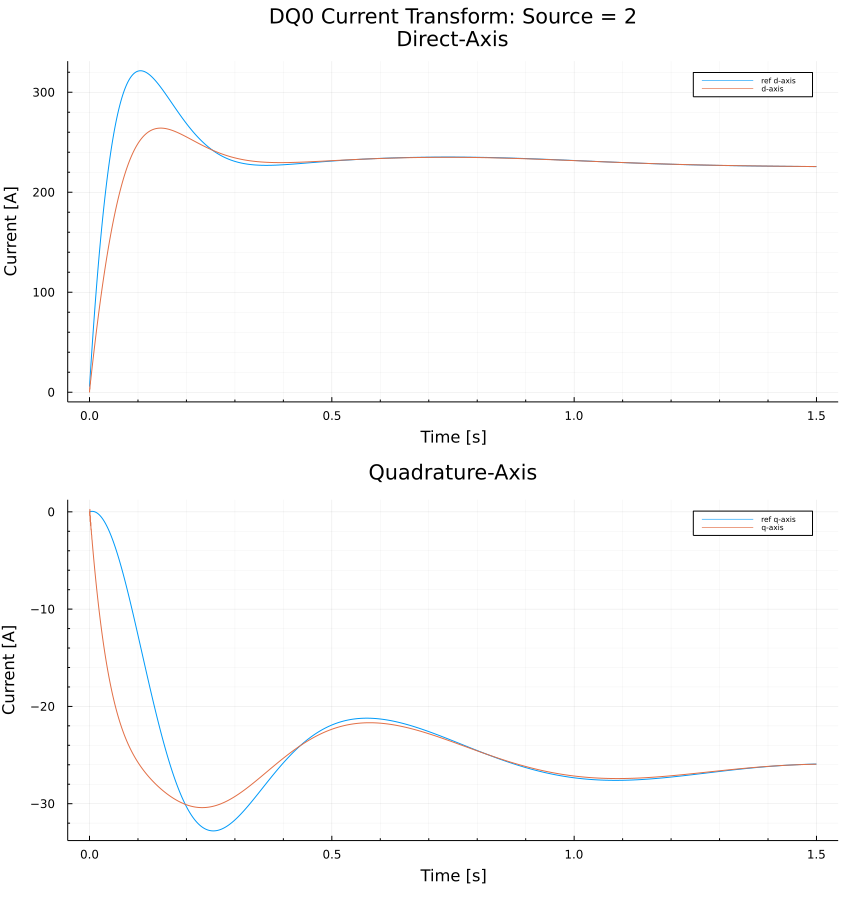

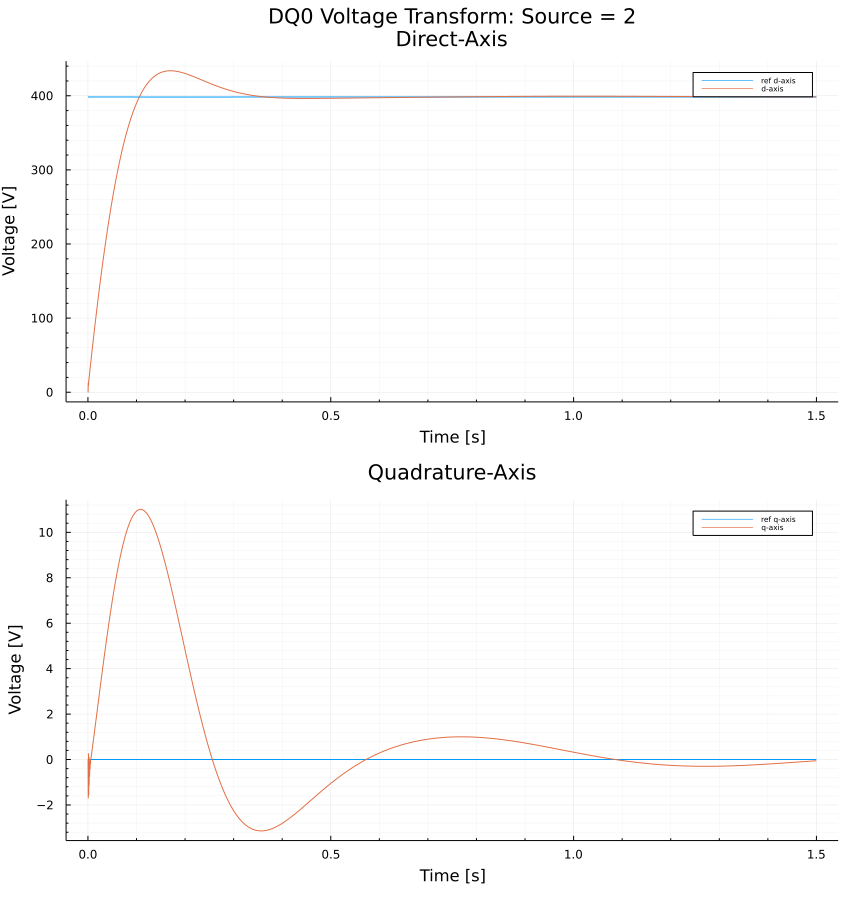

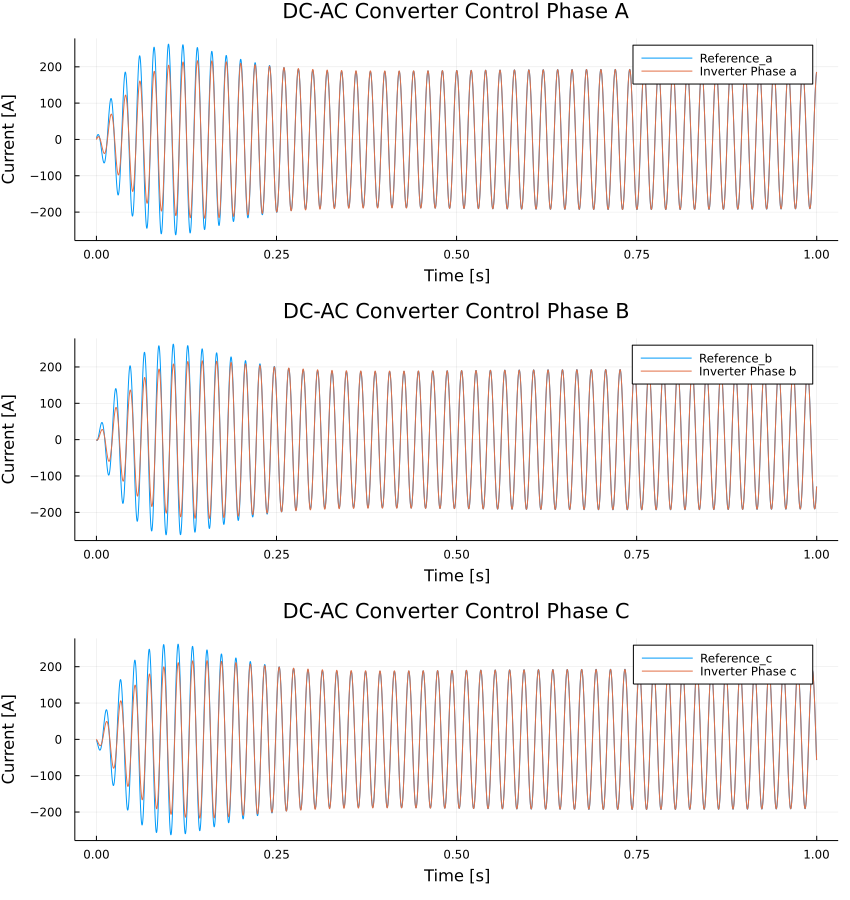

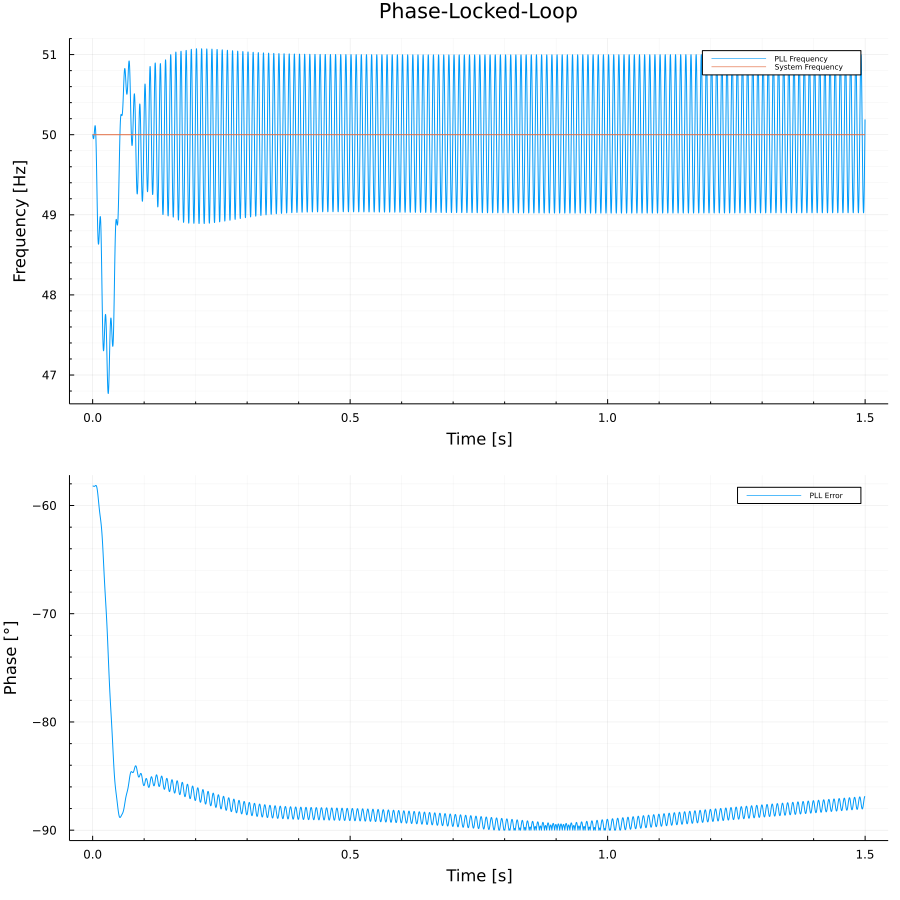

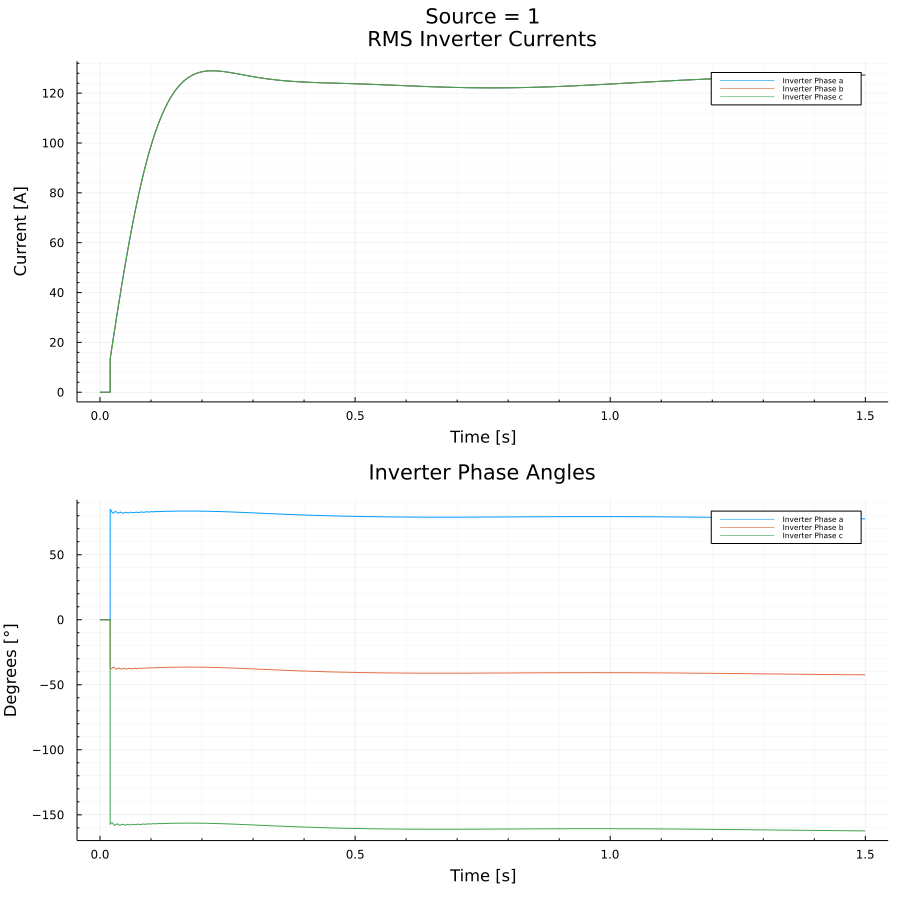

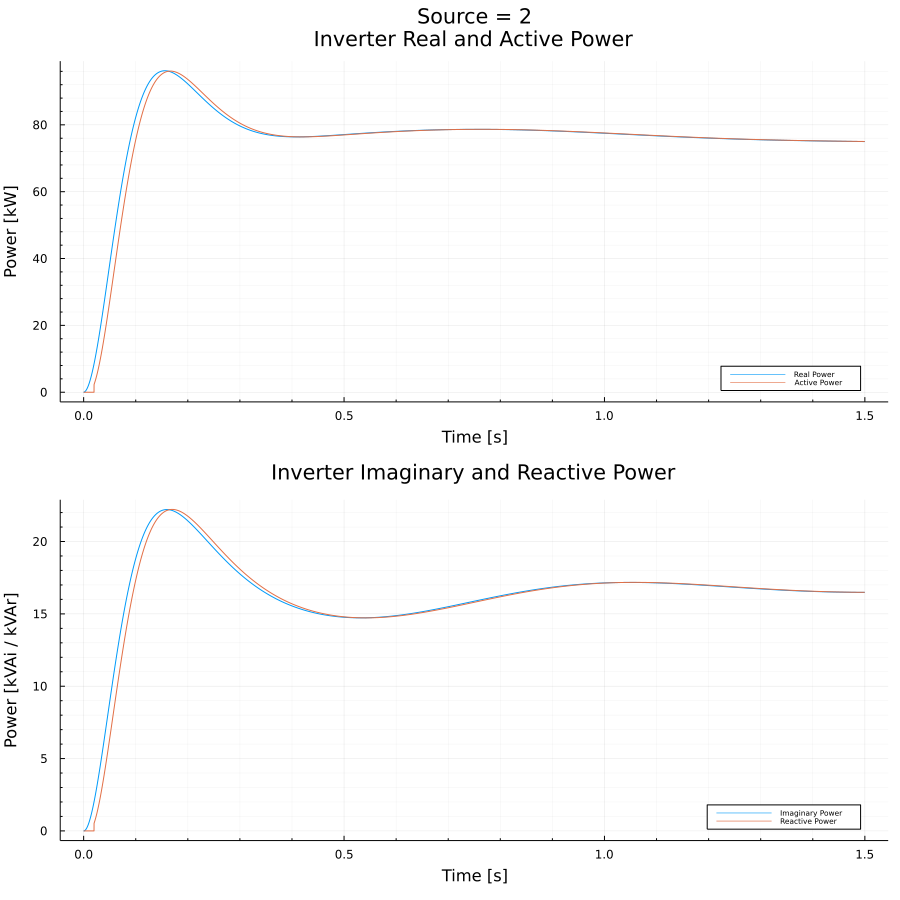

In [6]:
#%% Plots

Plot_I_dq0(0, 5000, Source, Env, num_source = 2);

Plot_V_dq0(0, 5000, Source, Env, num_source = 2);

Inst_Vout_Vref(0, 50, Source, Env, num_node = 1, num_source = 1);

Inst_Iout_Iref(0, 50, Source, Env, num_source = 2, num_node = 2);

Plot_PLL(0, 500, Source, Env, num_source = 2, ph = 2);

Plot_Irms(0, 5000, Env, num_node = 1);

Plot_Vrms(0, 5000, Env, Source, num_node = 1, num_source = 1);
Plot_Vrms(0, 5000, Env, Source, num_node = 2, num_source = 2);

#Plot_Real_Imag_Active_Reactive(0, 5000, Env, Source, num_node = 1, num_source = 1)
Plot_Real_Imag_Active_Reactive(0, 5000, Env, Source, num_node = 2, num_source = 2);

#Plot_fft(0, 1, Env, Source, num_node = 2, num_source = 2)